In [1]:
import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt


def view_coco_image(image_id):
    """
    Display an image from the COCO 2014 validation dataset given the image ID.

    Args:
    image_id (str): The COCO image ID (e.g., '000000000139')

    Returns:
    None
    """
    # Define the path to the COCO 2014 validation images
    images_path = "C:/Datasets/COCO/val2014"

    # Construct the filename from the image ID
    # COCO filenames are typically in the format 'COCO_val2014_000000000139.jpg'
    filename = f"COCO_val2014_{image_id.zfill(12)}.jpg"
    file_path = os.path.join(images_path, filename)

    # Check if the file exists
    if not os.path.exists(file_path):
        print("Image file not found.")
        return

    # Open and display the image
    with Image.open(file_path) as img:
        img.show()

def load_image_pairs(csv_file_path):
    # Load the CSV file
    data = pd.read_csv(csv_file_path)
    
    # Assuming the first two columns are image IDs
    image_pairs = data.iloc[:, :2].values
    
    return image_pairs


def view_coco_image_pairs(image_id_pairs):
    """
    Display pairs of images from the COCO 2014 validation dataset in a grid, where each pair is shown side by side.

    Args:
    image_id_pairs (list of lists of str): List of pairs of COCO image IDs (e.g., [['000000000139', '000000000285'], ['000000000764', '000000000924']])

    Returns:
    None
    """
    # Define the path to the COCO 2014 validation images
    images_path = "C:/Datasets/COCO/val2014"
    
    # Prepare the plot
    num_pairs = len(image_id_pairs)
    fig, axes = plt.subplots(num_pairs, 2, figsize=(10, 5 * num_pairs))  # Adjust the size as necessary
    
    if num_pairs == 1:  # If there's only one pair, ensure axes is 2D
        axes = [axes]

    for ax_row, (image_id1, image_id2) in zip(axes, image_id_pairs):
        for ax, image_id in zip(ax_row, [image_id1, image_id2]):
            # Construct the filename and path
            filename = f"COCO_val2014_{image_id.zfill(12)}.jpg"
            file_path = os.path.join(images_path, filename)
            
            # Check if the file exists
            if os.path.exists(file_path):
                img = Image.open(file_path)
                ax.imshow(img)
                ax.set_title(f"ID: {image_id}")
                ax.axis('off')
            else:
                ax.axis('off')
                ax.set_title("Image not found")

    plt.tight_layout()
    plt.show()



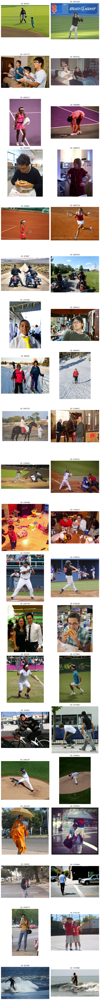

In [2]:
# view_coco_image("38710")
# view_coco_image("19221")

# Example usage:
csv_file_path ="C:/Users/ewang/OneDrive/Desktop/Spring_2024/COS_429/Final/imagecaptioning-bias/code/sim_stable_filtered.csv"  # Update this to the path of your CSV file
image_id_pairs = load_image_pairs(csv_file_path)

image_id_pairs = image_id_pairs[:20]
# If you want to print the first few pairs to check them
ids = [[str(num) for num in sublist] for sublist in image_id_pairs]

view_coco_image_pairs(ids)